### Prvi domaći zadatak iz digitalne obrade slike


*Autor: Martin Cvijović 558/2017*

In [1]:
%matplotlib inline
from pylab import *
# from __future__ import print_function

# from ipywidgets import interact, interactive, fixed, interact_manual
# import ipywidgets as widgets

import skimage
from skimage import *
from skimage.color import *
from skimage.exposure import *
from skimage.filters import *
from skimage.restoration import *

import time

import numpy as np

### 1. Zadatak

U prvom zadatku potrebno je mapirati sliku veoma širokog dinamičkog opsega, *sea.hdr*. Sliku je potrebno skalirati u normalizovani opseg [0, 1] i nakon toga izvršiti određene transformacije nad pojedinačnim pikselima. 

In [2]:
# 1. Za ucitavanje HDR slike potrebna nam je imageio ekstenzija
import imageio
imageio.plugins.freeimage.download()

In [3]:
# Ucitavanje ulazne slike
img = imageio.imread("../sekvence/sea.hdr", format='HDR-FI')
img_rescaled = img/max(img.flatten()) # Skaliranje u opseg [0, 1]

Tačka a: Linearno mapiranje

In [4]:
def linear_transform(f, scale):
    g = f * scale
    g = g**(1/2.2)   # gama korekcija
    g[g > 1] = 1     # slika mora ostati u zeljenom opsegu [0,1]
    g[g < 0] = 0
    
    return g

U tački a korišćena je jednostavna linearna funkcija sa gama korekcijom. Nakon skaliranja slike, vrednosti koje ispadaju iz opsega *[0,1]* bivaju zasićene na vrednost 0 ili 1. 

In [5]:
A = 1
B = 15
C = 40
img_lin_a = linear_transform(img_rescaled, A)
img_lin_b = linear_transform(img_rescaled, B) 
img_lin_c = linear_transform(img_rescaled, C)

Što se tiče traženih parametara A, B i C, pomoću naredbe *interact* se dolazi do istih: A = 1, B = 15, C = 40

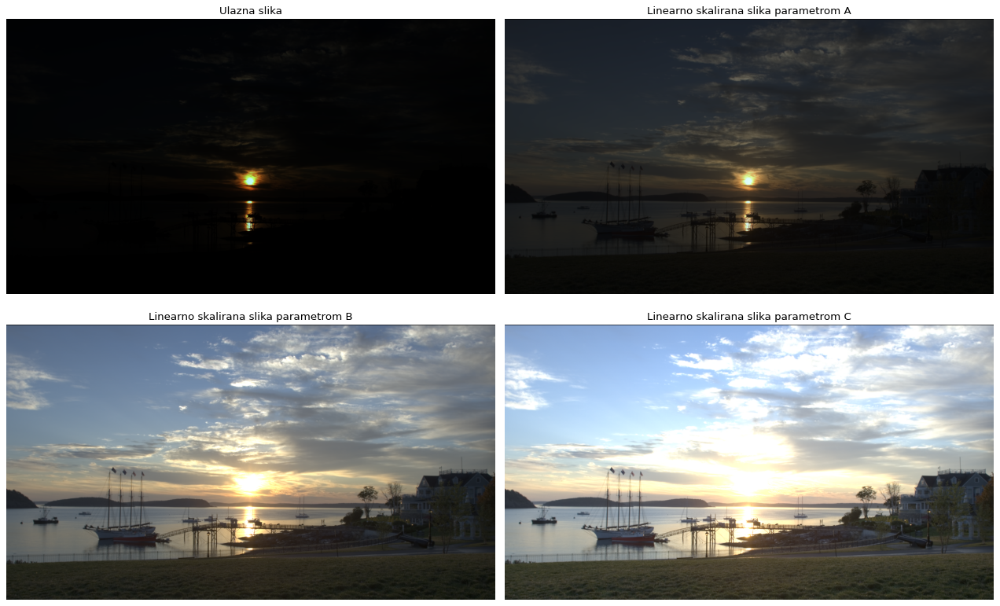

In [6]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(16,10), dpi=80)
axes = ax.ravel()

axes[0].imshow(img_rescaled); axes[0].axis('off'); axes[0].set_title('Ulazna slika')
axes[1].imshow(img_lin_a); axes[1].axis('off'); axes[1].set_title('Linearno skalirana slika parametrom A')
axes[2].imshow(img_lin_b); axes[2].axis('off'); axes[2].set_title('Linearno skalirana slika parametrom B')
axes[3].imshow(img_lin_c); axes[3].axis('off'); axes[3].set_title('Linearno skalirana slika parametrom C')
plt.tight_layout()
plt.show()

Primećujemo da najveći problem na slici pravi zalazeće sunce, čiji pikseli imaju ubedljivo najveći intenzitet, što rezultira time da se ostatak slike ni ne vidi. Linearnim skaliranjem i zasićenjem preskaliranih parametara praktično činimo da se najsvetliji pikseli (u ovom slučaju pikseli sunca) izbacuju iz opsega *[0,1]*, dok se ostali pikseli, nezavisno, linearno skaliraju do tog opsega, nakon čega se najsvetliji pikseli postavljaju na vrednost 1. Rezultati su najuočljiviji na slici skaliranoj parametrom B. Na slici skaliranoj parametrom C je došlo do preterivanja u skaliranju gde su i neki pikseli van sunca premašili opseg od *[0,1]*. Ostatak slike je svetliji nego na slici skaliranoj parametrom B, međutim, zasićenje piksela u okolini sunca je jako izraženo.

Tačka B: Stepena i logaritamska transformacija

Pomoću funkcionalnosti 'interact' biblioteke *ipywidgets* iterativnom metodom se dolazi do optimalnih vrednosti eksponenata u logaritamskoj, odnosno eksponencijalnoj funkciji.
Eksponent kod logaritamske transformacije iznosi 2.6 dok kod eksponencijalne iznosi 0.4.

In [7]:
# Logaritamska funkcija 
def log_transform(image, c):
    return log(1 + (10**c)*image)/log(1 + 10**c) # Nije potrebno preskalirati sliku, koeficijenti ce uvek biti manji od 1
    
# Stepena funkcija
def exp_transform(image, c):
    g = image**c  
    return g/max(g.flatten()) # Preskaliranje slike nazad u opseg 0,1

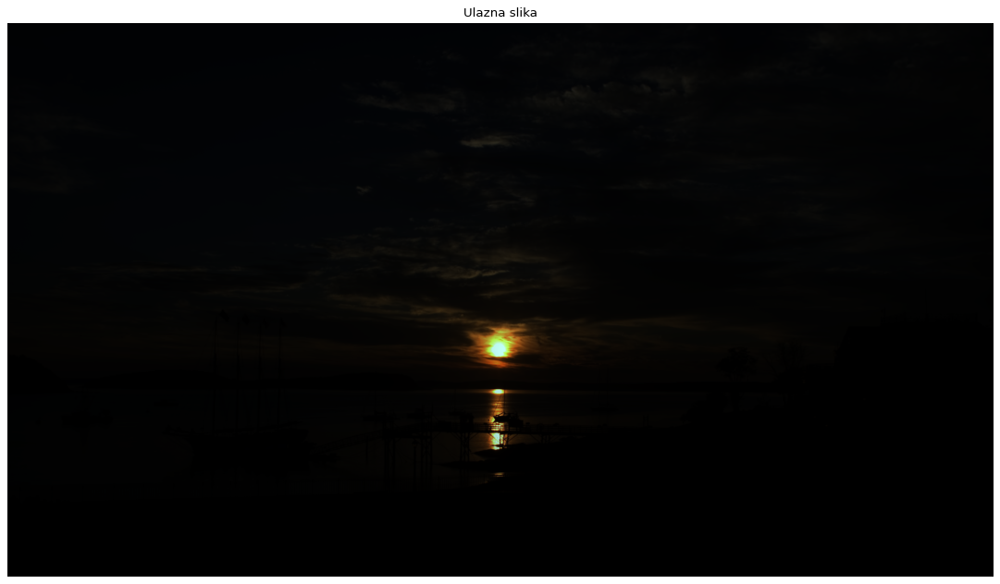

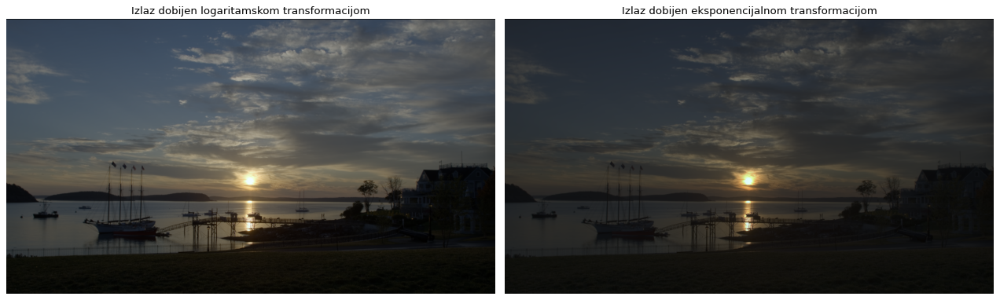

In [8]:
img_log = log_transform(img_rescaled, 2.6)
img_exp = exp_transform(img_rescaled, 0.4)

figure(figsize=(16,8), dpi=80); imshow(img_rescaled); gca().axis('off'); gca().set_title('Ulazna slika')
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(16, 8), dpi=80)
ax[0].imshow(img_log); ax[0].axis('off'), ax[0].set_title('Izlaz dobijen logaritamskom transformacijom')
ax[1].imshow(img_exp); ax[1].axis('off'), ax[1].set_title('Izlaz dobijen eksponencijalnom transformacijom')
plt.tight_layout()
plt.show()

Tačka C: Dodatno

Linearna, eksponencijalna i logaritamska transformacija su dale jako dobre rezultate uz malu kompleksnost procesiranja, vremenska kompleksnost tih operacija je reda O(n^2). Međutim, kvaliteti izlaznih slika se mogu znatno poboljšati. Linearno skalirana slika će, u šta smo se uverili pomoću parametara A, B i C, imati ili nešto lošiji kontrast, ili jako izraženo zasićenje piksela u okolini sunca. Sa druge strane, slike dobijene eksponencijalnom i logaritamskom transformacijom daju dosta veći nivo detalja u okolini sunca, dok, sa druge strane, moraju biti prilično tamne jer će u suprotnom biti jako svetle sa izrazito lošim kontrastom i jakim zasićenjem u okolini sunca.

Što se tiče novih mapiranja, skaliranje određenog procenta piksela slike ne daje previše kvalitetne rezultate. Na slici dobijenoj takvim skaliranjem će se za visok procenat tamnijih piksela kombinovati zasićenje u okolini sunca sa tamnim pikselima na kopnu, dok će se na nižim procentima izgubiti veliki deo detalja slike.

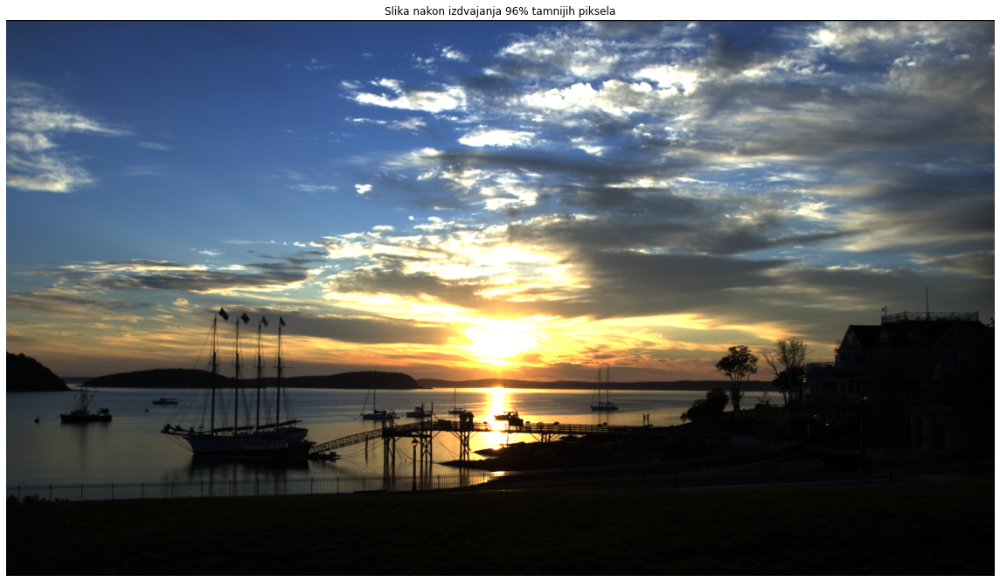

In [9]:
img_percentile = rescale_intensity(img_rescaled, in_range=(0,np.percentile(img_rescaled,96)), out_range=(0,1))

figure(figsize=(16,10)); 
imshow(img_percentile); gca().axis('off'); gca().set_title('Slika nakon izdvajanja 96% tamnijih piksela')
plt.tight_layout()
plt.show()

Rešenje sa najboljim kontrastom i najvećim nivoom detalja je adaptivna ekvalizacija histograma. Sama ekvalizacija na originalnoj slici ne bi ništa značajno promenila, stoga je urađena ekvalizacija histograma na slici dobijenoj logaritamskom transformacijom ulazne slike. Adaptivna ekvalizacija može (u ovom slučaju i jeste) da ispolji određene nepravilnosti koje su posledica ekvalizacije histograma nezavisnih segmenata slike. Konkretno u ovom slučaju, segment kopna je dosta bolje osvetljen, ali se primećuje da oblaci nisu ni blizu toliko skalirani te su oni došli do dosta većeg izražaja. Međutim, nivo detalja je jako visok, što se vidi u detaljima kuće i trave, kao i u niskom broju zasićenih piksela u okolini zalazećeg sunca.

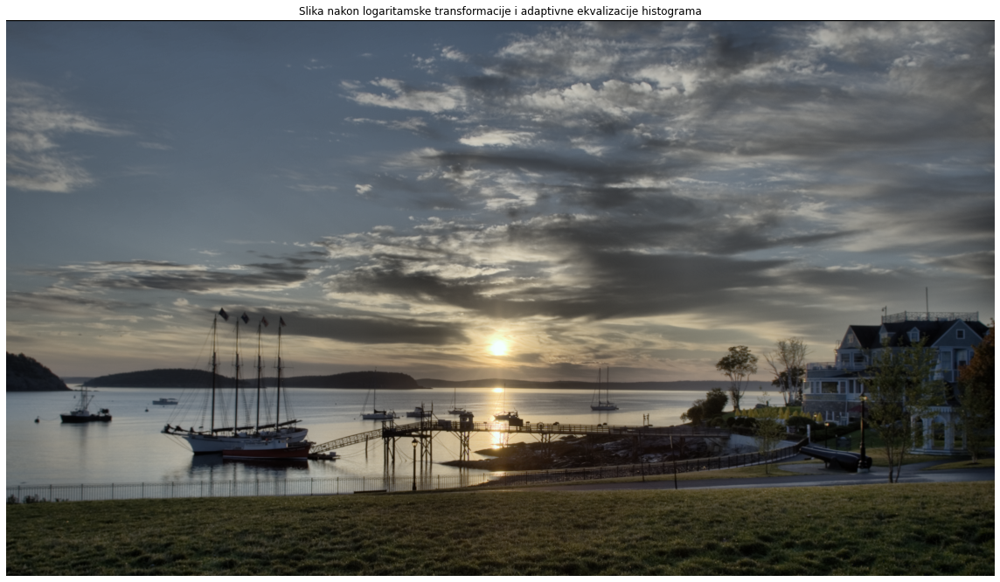

In [10]:
img_eq = equalize_adapthist(log_transform(img_rescaled, 3))
figure(figsize=(16,10)); 
imshow(img_eq); gca().axis('off'); gca().set_title('Slika nakon logaritamske transformacije i adaptivne ekvalizacije histograma')
plt.tight_layout()
plt.show()

### 2. Zadatak

U drugom zadatku potrebno je realizovati selektivnu dekolorizaciju slike. Kao ulaz dobijamo dve slike na kojima treba izdvojiti regione obojene bordo i žutom bojom, respektivno. Neizdvojeni deo slike treba obojiti sivo.

Budući da nije dozvoljeno ručno praviti masku i uokviriti delove koje treba ostati obojeni, maska se pravi automatski. Pokazuje se da je izuzetno nepraktično tražiti boju u RGB sistemu iz više razloga, od kojih su najveći probem činjenice da gotovo nikad nisu u pitanju jedna boja, već neki opseg jedne boje, kao i razlog da vrlo često boja koju želimo da izdvojimo je zapravo mešavina više različitih osnovnih boja. Navedeni problemi izuzetno povećavaju verovatnoću da ćemo povući veliku količinu šuma zajedno sa bojom koju pokušavamo da izdvojimo. 

Iz tog razloga ćemo, pre obrade, sliku prebaciti u HSV kolor sistem koji boju opisuje pomoću 3 argumenta: *saturation, hue* i *value*. Podešavanjem *hue* opsega ćemo moći dosta preciznije da izdvojimo okolinu boje koja nam treba, dok podešavanjem *saturation* i *value* opsega izdvajamo opseg nijansi koji se poklapa sa regionom koji je potrebno izdvojiti. Konkretno u primery *marlyn.jpg*, *hue* parametar će opsegom [0.82,1] selektovati nijanse crvene/bordo, u kombinaciji sa *saturation* parametrom koji je veći od 0.5 (primer [0.61, 1]), čime se postiže da se svetli delovi kose prebace u sivu boju dok se manje svetli delovi na usnama čuvaju. Value parametar je ostao netaknut.

Ekvivalentna funkcija funkciji *rgb2gray* u HSV slici se postiže tako što se kod piksela van generisane maske *saturation* vrednost postavi na 0.

In [11]:
marlyn = imread("../sekvence/marlyn.jpg")
street = imread("../sekvence/street.jpg")

In [12]:
def selective_color(img, hue_min, hue_max, sat_min, sat_max, val_min, val_max):
    img_hsv = rgb2hsv(img)
    img_hue = img_hsv[:, :, 0] 
    img_sat = img_hsv[:, :, 1]
    img_val = img_hsv[:, :, 2]
 
    mask = (img_hsv[:, :, 0] > hue_min) & (img_hsv[:, :, 0] < hue_max) & (img_hsv[:, :, 1] > sat_min) & (img_hsv[:, :, 1] < sat_max) & (img_hsv[:, :, 2] > val_min) & (img_hsv[:, :, 2] < val_max)
    
    # Efektivni grayscale postizemo zakucavanjem 'saturation' vektora na 0
    img_hsv_grayscale = rgb2hsv(img)
    img_hsv_grayscale[:, :, 1] = 0 # img_hsv_grayscale je crno-bela slika img
    
    out_img = zeros(shape(img_hsv))
    out_img[mask] = img_hsv[mask]
    out_img[~mask] = img_hsv_grayscale[~mask]
    
    out_rgb = hsv2rgb(out_img)
    
    return out_rgb

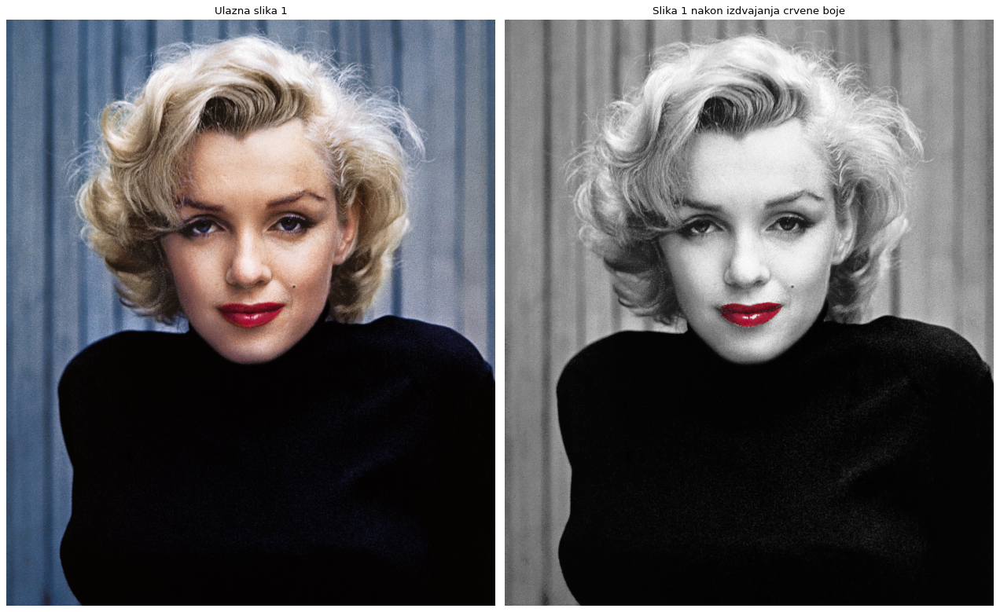

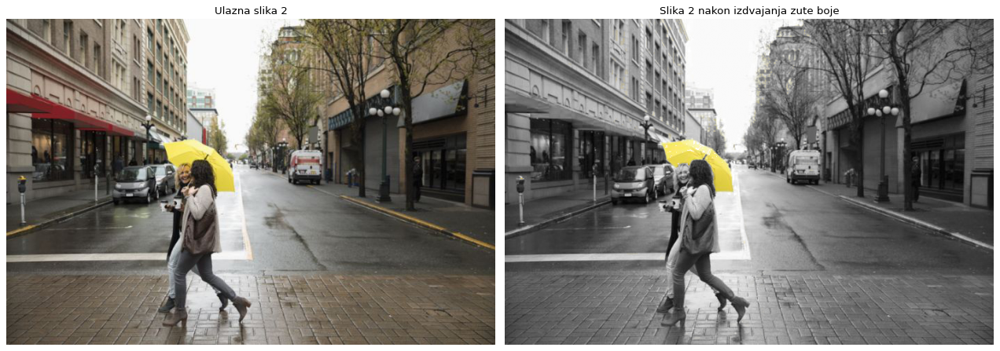

In [13]:
marlyn = imread("../sekvence/marlyn.jpg")
street = imread("../sekvence/street.jpg")

marlyn_red = selective_color(marlyn, 0.79, 1, 0.5, 1, 0, 1)
street_yellow = selective_color(street, 0.13, 0.18, 0, 1, 0.7, 1)

fig, axes = plt.subplots(ncols=2, figsize=(16, 10), dpi=80)
ax = axes.ravel()
ax[0].imshow(marlyn); ax[0].axis('off'), ax[0].set_title('Ulazna slika 1')
ax[1].imshow(marlyn_red); ax[1].axis('off'), ax[1].set_title('Slika 1 nakon izdvajanja crvene boje')
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(ncols=2, figsize=(16, 8), dpi=80)
ax = axes.ravel()
ax[0].imshow(street); ax[0].axis('off'), ax[0].set_title('Ulazna slika 2')
ax[1].imshow(street_yellow); ax[1].axis('off'), ax[1].set_title('Slika 2 nakon izdvajanja zute boje')
plt.tight_layout()
plt.show()

Bitno je napomenuti da, iako je moguće ručno podesiti boju bez ikakvog razmišljanja pomoću naredbe *interact*, moguće je sa velikom preciznošću utvrditi koje opsege HSV parametara treba iskoristiti da bismo izdvojili boju koja nam je potrebna.

Uzmimo za primer sliku *street.jpg*. Ukoliko pogledamo grafik HSV kolor sistema, primetićemo da žuta boja zaklapa *hue* ugao od 60 stepeni. Ceo krug od 360 stepeni je u biblioteci *scikit-image* preslikan u opseg *[0,1]*, što znači da se naša *hue* vrednost nalazi u neposrednoj okolini broja 0.166. Ukoliko za *hue* opseg uzmemo, na primer, interval *[0.13, 0.18]*, primetićemo da smo, zajedno sa izdvajanjem kišobrana, izdvojili još neke delove slike koje nije trebalo da izdvojimo. Konkretno u slučaju *hue = [0.13, 0.18]*, uspeli smo da izbegnemo izdvajanje narandžastih linija na kolovozu ali nismo uspeli da izbegnemo izdvajanje određenih ivica na lišću drveća. Te boje se po *hue* vrednosti poklapaju sa opsegom koji smo izabrali, međutim, te boje su dosta tamnije. Dovoljno je, pored korigovanja *hue* vrednosti, odbaciti tamniji deo *value* vrednosti, čime ćemo sa velikom preciznošću izdvojiti samo svetlo žute boje sa slike, što rezultira izdvojenim kišobranom, dok je ostatak slike pretvoren u sivu boju anuliranjem *saturation* vrednosti svih piksela van maske.

### 3. Zadatak

U trećem zadatku je potrebno filtrirati ulaznu sliku izbegavajući zamućivanje značajnih ivica. Potrebno je realizovati funkciju *bilateral_filter* koja kao ulazne argumente prima sliku *x*, koja može biti tipa *uint8 ([0,255])* ili *double ([0,1])*. Takođe, pored ulazne slike, dodatna dva ulazna argumenta su *sigma_s* i *sigma_r* gde je *r* dimenzija prostorne maske (2r+1)x(2r+1).

In [58]:
def bilateral_filter(x, radius, sigma_s, sigma_r):
    
    # funkcija shape ce baciti exception ukoliko broj parametara koje pokusava da vrati nije jednak 2,sto je slucaj kod slike u boji
    try:
        M, N = shape(x) 
    except:
        print("Funkcija ne prihvata slike u boji. Ulazna slika ostaje nepromenjena.")
        return x
    
    x_rescaled = x
    if (max(x.flatten()) > 1): # prebacujemo sliku u opseg [0, 1]
        x_rescaled = x_rescaled / 255
        
    x_stretched = zeros((M+radius*2, N+radius*2), dtype='float') # prosirena slika za masku, trenutno su nule okolo
    
    start_time = time.time()
    
    # prosirenje slike ponavljanjem ivica
    x_stretched[radius:M+radius,radius:N+radius] = x_rescaled
    
    # ugaoni pikseli uzimaju vrednost ugaonog piksela originalne slike
    x_stretched[0:radius, 0:radius] = x_rescaled[0, 0]
    x_stretched[M+radius:M+2*radius, 0:radius] = x_rescaled[M-1, 0]
    x_stretched[0:radius, N+radius:N+2*radius] = x_rescaled[0, N-1]
    x_stretched[M+radius:M+2*radius, N+radius:N+2*radius] = x_rescaled[M-1, N-1]
    
    # ostali pikseli po ivici slike uzimaju vrednost ivice slike
    for i in range(radius):
        x_stretched[radius: M+radius, i] = x_rescaled[0:M, 0]
        x_stretched[radius: M+radius, N+2*radius-i-1] = x_rescaled[0:M, N-1]
        x_stretched[0:radius, radius:N+radius] = x_rescaled[0, 0:N]
        x_stretched[M+radius: M+2*radius, radius:N+radius] = x_rescaled[M-1, 0:N]
    
    x_out = zeros((M, N), dtype='float') # slika koju vracamo
    
    print("Velicina slike: " + str(M) + "x" + str(N) + " piksela.")
    
    k = list(range(-radius, radius + 1))
    l = list(range(-radius, radius + 1))
    
    K, L = meshgrid(k, l) # bolje performanse
    
    mask_const = exp(-(L**2+L**2) / (2*sigma_s**2))
        
    for i in range(radius, M+radius):
        for j in range(radius, N+radius):
            
            # Debagovanje...
            update_string = "Vreme izvrsavanja = " + str(round(time.time() - start_time,3)) + "s."
            print(update_string, end='\r')
            
            # Drugi cinilac filtra w, razlicit za svaki piksel (radius-okolina piksela)
            x_stretched_sub = x_stretched[i-radius:i+radius+1, j-radius:j+radius+1]
            
            # Mnozimo prvi cinilac sa drugim, u koraku sumiramo sve
            w = mask_const * exp(-(x_stretched_sub-x_stretched[i, j])**2 / (2*sigma_r**2))
            w = w/sum(w.flatten())

            x_out[i - radius, j - radius] = sum(w*x_stretched_sub)        
            
    
    if (max(x.flatten()) > 1): # vracamo skalu na sliku
        x_out = x_out * 255
        
    end_time = time.time()
    execution_time = end_time - start_time
    
    print ("Vreme izvrsavanja = " + str(round((execution_time*1e6)/np.size(x), 3)))
        
    return x_out

Velicina slike: 440x455 piksela.
Vreme izvrsavanja = 275.614.

Vreme izvrsavanja ugradjene funkcije: 0.035s.


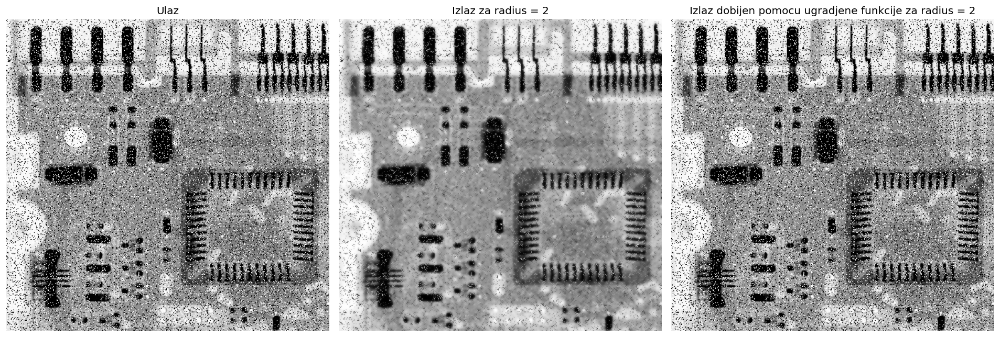

Velicina slike: 440x455 piksela.
Vreme izvrsavanja = 274.758.

Vreme izvrsavanja ugradjene funkcije: 0.165s.


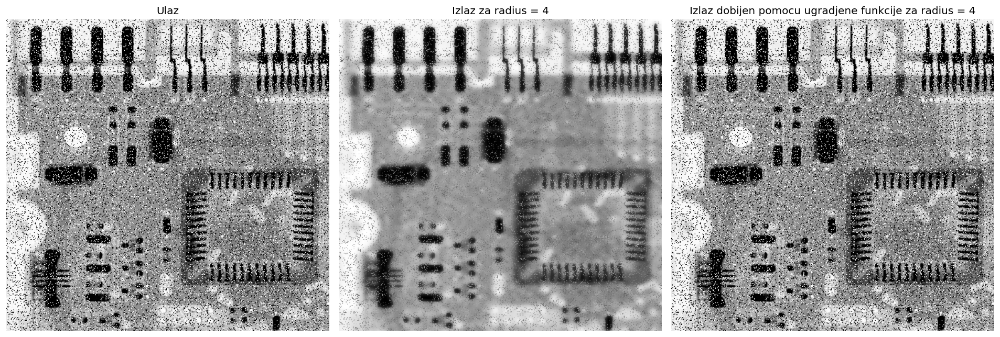

Velicina slike: 440x455 piksela.
Vreme izvrsavanja = 379.632.

Vreme izvrsavanja ugradjene funkcije: 4.875s.


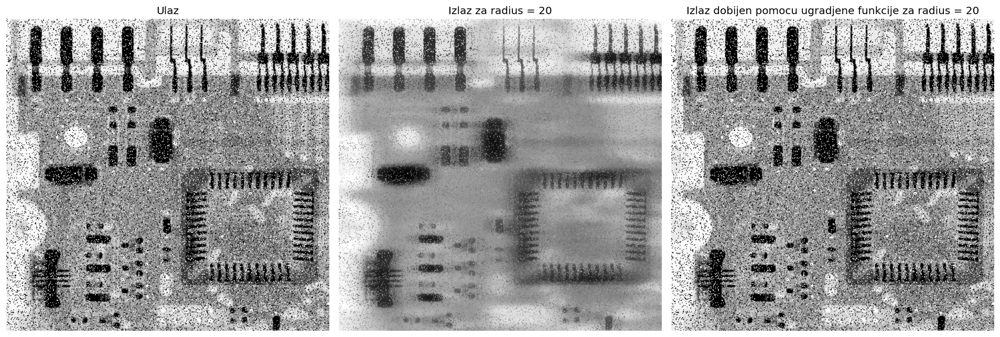

Velicina slike: 440x455 piksela.
Vreme izvrsavanja = 525.564s.

Vreme izvrsavanja ugradjene funkcije: 24.04s.


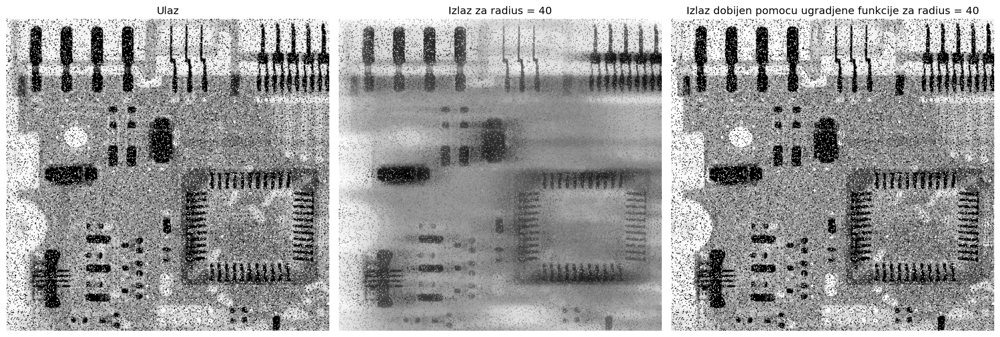

In [59]:
f = imread('../sekvence/ckt_board.tif')

radius_arr = [2, 4, 20, 40]

for radius in radius_arr:

    g = bilateral_filter(f, radius, 5, 0.5)

    start_time_included = time.time()
    g1 = denoise_bilateral(f, radius, 5, 0.5)
    end_time_included = time.time()
    exec_time_included = end_time_included - start_time_included

    print("\nVreme izvrsavanja ugradjene funkcije: " + str(round(exec_time_included*1e6 / np.size(f), 3)) + "s.")

    fig, axes = plt.subplots(ncols=3, figsize=(16,10), dpi=120)
    ax = axes.ravel()

    ax[0].imshow(f, cmap='gray'); ax[0].set_title('Ulaz'); ax[0].axis('off')
    ax[1].imshow(g, cmap='gray'); ax[1].set_title('Izlaz za radius = ' + str(radius)); ax[1].axis('off')
    ax[2].imshow(g1, cmap='gray'); ax[2].set_title('Izlaz dobijen pomocu ugradjene funkcije za radius = ' + str(radius)); ax[2].axis('off')

    plt.tight_layout()
    plt.show()

Što se tiče bilateralnog filtra, vremenske optimizacije su prilično teške za izvođenje. Razlog za to je činjenica da je sama maska različita za svaki piksel slike, što znači da ju je potrebno posebno računati za svaki piksel. Čak i vrednosti koje su dobijene za jedan piksel se moraju odbaciti za računanje sledećeg piksela zbog različite prostorne udaljenosti. Jedine optimizacije koje su moguće za izvršavanje su korišćenje što je više moguće ugrađenih funkcija umesto kucanje koda ručno. Te funkcije (na primer, funkcije i strukture podataka biblioteke *numpy*) su, uglavnom, već kompajlirane za jezik C.